In [1]:
import h5pyd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy.spatial import cKDTree

# Integración de Datos para la Predicción de Producción Solar 

**Objetivo:**  
Predecir con precisión la producción de energía solar en plantas a gran escala mediante el uso de datos meteorológicos detallados y el historial de producción.

## Fuentes de Datos

- **NSRDB: National Solar Radiation Database (Base de Datos Nacional de Radiación Solar)**
    - Datos de irradiancia solar: **GHI**, DNI, DHI.
    - Variables meteorológicas: temperatura, viento, entre otras.
    - Resolución: cada 30 minutos o cada hora.

- **EIA: Energy Information Administration (Administración de Información Energética).**
    - Datos de producción total de la planta.
    - Resolución: datos mensuales.


## Desafío

Los conjuntos de datos poseen diferente resolución temporal:  
- NSRDB ofrece datos de **alta resolución** (horarios/30 minutos).  
- EIA provee datos **mensuales**.


## Metodología: Desagregación Temporal

1. **Obtención de Datos:**  
     - NSRDB: Datos horarios para una ubicación específica.
     - EIA: Datos mensuales de producción.

2. **Distribución de la Producción:**  
     - **Desagregación Temporal:**  
         Se distribuye la producción mensual conocida a lo largo de las horas del mes utilizando la GHI como factor de proporcionalidad.
     - **Regla de Distribución:**  
         A mayor GHI en una hora, mayor proporción de la producción se asigna a dicha hora.

3. **Entrenamiento del Modelo:**  
     - Uso de un modelo de machine learning que relacione las variables meteorológicas (datos horarios del NSRDB) con la producción horaria estimada.

4. **Predicción Futura:**  
     - El modelo es empleado para predecir la producción de energía solar de forma horaria, utilizando pronósticos meteorológicos.

## Resultado

- Se genera un **conjunto de datos horario** que integra:
    - Variables meteorológicas detalladas (NSRDB).
    - Producción horaria estimada (desagregada a partir de datos mensuales de EIA).
    
- Este conjunto de datos sirve de base para entrenar modelos de predicción más precisos, permitiendo estimar la producción futura de la planta de manera puntual.

- **Aplicación Específica:**  
    El proceso se adapta a *Copper Mountain Solar, Nevada* utilizando sus coordenadas y datos reales de producción, aprovechando la alta resolución del NSRDB y complementándola con la información mensual de la EIA.

**Conclusión:**  
La desagregación temporal permite integrar datos con diferentes resoluciones, facilitando la predicción precisa de la producción solar y adaptándola al contexto específico de la planta.

In [ ]:
import h5pyd

try:
    f = h5pyd.File("/nrel/nsrdb/v3/nsrdb_2012.h5", 'r')  # Provamos la conexion con la base de datos
    print("Conexión exitosa!")



    f.close()

except OSError as e:
    print(f"Error de conexión: {e}")
    print("Verifica tu archivo .hscfg, tu API Key y tu conexión a Internet.")
except Exception as e:
    print(f"Ocurrió un error: {e}")

Conexión exitosa!


In [ ]:
f = h5pyd.File("/nrel/nsrdb/v3/nsrdb_2020.h5")  # Establecemos conexion a la base de datos mediante un API
# y especificamos el año de la base de datos que se usara

In [4]:
list(f.attrs) 


['version']

In [ ]:
for k in f:    #Imprimimos los nombres de las tablas de la base de  datos
    dset = f[k]
    print(f"{dset.name} {dset.shape}")

/air_temperature (17568, 2018392)
/alpha (17568, 2018392)
/aod (17568, 2018392)
/asymmetry (17568, 2018392)
/cld_opd_dcomp (17568, 2018392)
/cld_reff_dcomp (17568, 2018392)
/clearsky_dhi (17568, 2018392)
/clearsky_dni (17568, 2018392)
/clearsky_ghi (17568, 2018392)
/cloud_press_acha (17568, 2018392)
/cloud_type (17568, 2018392)
/coordinates (2018392, 2)
/dew_point (17568, 2018392)
/dhi (17568, 2018392)
/dni (17568, 2018392)
/fill_flag (17568, 2018392)
/ghi (17568, 2018392)
/meta (2018392,)
/ozone (17568, 2018392)
/relative_humidity (17568, 2018392)
/solar_zenith_angle (17568, 2018392)
/ssa (17568, 2018392)
/surface_albedo (17568, 2018392)
/surface_pressure (17568, 2018392)
/time_index (17568,)
/total_precipitable_water (17568, 2018392)
/wind_direction (17568, 2018392)
/wind_speed (17568, 2018392)


In [ ]:

dset_coords = f['coordinates'][...]     #Establecemos la geolocalizacion de la data que se usara para crear uns dataframe
tree = cKDTree(dset_coords)
def nearest_site(tree, lat_coord, lon_coord):
    lat_lon = np.array([lat_coord, lon_coord])
    dist, pos = tree.query(lat_lon)
    return pos

copper_mountain_solar = (36.1719, -115.14)     #especificamos la latitud y longitud de las cordenadas de la planta solar
copper_mountain_solar_idx = nearest_site(tree, copper_mountain_solar[0], copper_mountain_solar[1] )

print("Site index for Copper Mountain Solar: \t\t {}".format(copper_mountain_solar_idx))
print("Coordinates of Copper Mountain Solar: \t {}".format(copper_mountain_solar))
print("Coordinates of nearest point: \t {}".format(dset_coords[copper_mountain_solar_idx]))


Site index for Copper Mountain Solar: 		 105130
Coordinates of Copper Mountain Solar: 	 (36.1719, -115.14)
Coordinates of nearest point: 	 [  36.17 -115.14]


In [ ]:
data = {} #Creamos un diccionario donde se alacenaran los datos que usaremos 

In [ ]:
data['ghi'] = f['ghi'][:, copper_mountain_solar_idx]  #especificamos que la data debe tener las cordenadas objetivo
data['dni'] = f['dni'][:, copper_mountain_solar_idx]
data['dhi'] = f['dhi'][:, copper_mountain_solar_idx]
data['air_temperature'] = f['air_temperature'][:, copper_mountain_solar_idx]
data['wind_speed'] = f['wind_speed'][:, copper_mountain_solar_idx]
data['solar_zenith_angle'] = f['solar_zenith_angle'][:, copper_mountain_solar_idx]

In [ ]:
if 'relative_humidity' in f: 
    data['relative_humidity'] = f['relative_humidity'][:, copper_mountain_solar_idx]
if 'dew_point' in f:
    data['dew_point'] = f['dew_point'][:, copper_mountain_solar_idx]
if 'surface_albedo' in f:
    data['surface_albedo'] = f['surface_albedo'][:, copper_mountain_solar_idx]
if 'total_precipitable_water' in f:
    data['total_precipitable_water'] = f['total_precipitable_water'][:, copper_mountain_solar_idx]
if 'wind_direction' in f:
    data['wind_direction'] = f['wind_direction'][:, copper_mountain_solar_idx]
if 'surface_pressure' in f:
    data['surface_pressure'] = f['surface_pressure'][:, copper_mountain_solar_idx]

time_index = pd.to_datetime(f['time_index'][:].astype(str), utc=True)   #asignamos el formato datetime a la columna de tiempo

df = pd.DataFrame(data, index=time_index)   # creamos el dataframe con el diccionario data y la columna de datetime
df = df.tz_convert('America/Los_Angeles')  

df.head()   #Visualisamos las primeras cinco columnas de nuestro dataframe


,ghi,dni,dhi,air_temperature,wind_speed,solar_zenith_angle,relative_humidity,dew_point,surface_albedo,total_precipitable_water,wind_direction,surface_pressure
2019-12-31 16:00:00-08:00,57,463,13,69,13,8450,4462,-43,18,6,32,945
2019-12-31 16:30:00-08:00,12,146,10,66,13,8937,4554,-43,18,6,25,945
2019-12-31 17:00:00-08:00,0,0,0,63,13,9519,4208,-57,18,6,17,946
2019-12-31 17:30:00-08:00,0,0,0,60,14,10077,4296,-57,18,6,10,946
2019-12-31 18:00:00-08:00,0,0,0,57,14,10649,4273,-60,18,6,3,946


In [ ]:
df.shape  #visualisamos su forma

(17568, 12)

In [ ]:
f.close()  # cerramos la conexion  a la base de datos

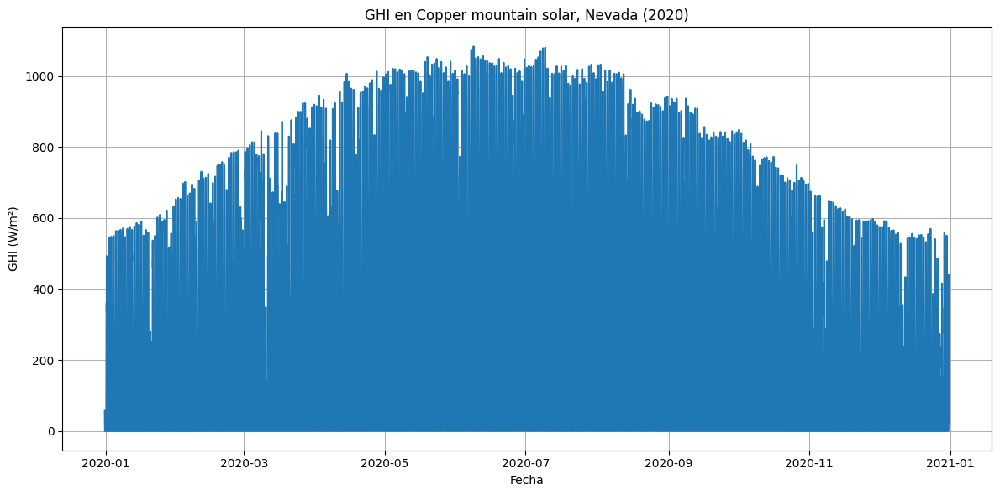

In [ ]:
if isinstance(df.index, pd.DatetimeIndex):   #Graficamos el comportamiento de la Radicion Global Horizontal ('GHI')
    tseries = df["ghi"] 
    plt.figure(figsize=(12, 6))  
    plt.plot(df.index, tseries)  
    plt.ylabel("GHI (W/m²)")  
    plt.xlabel("Fecha")  
    plt.title("GHI en Copper mountain solar, Nevada (2020)")  
    plt.tight_layout()
    plt.show()

else:
    print("Error: El DataFrame 'df' no tiene un DatetimeIndex como índice.")
    print("Asegúrate de haber creado el DatetimeIndex correctamente.")
    print("Consulta los ejemplos anteriores para ver cómo hacerlo.")

In [13]:
#importar los datos de la dfproduccion real de Cooper Mountain Solar

df_e = pd.read_csv('D:\BOOTCAMP\DataBootcamp\Gneration_Energy_Copper.csv')
df_e.head().T

,0
Netgen\nJanuary,"21,192"
Netgen\nFebruary,"26,756"
Netgen\nMarch,"28,580"
Netgen\nApril,"33,698"
Netgen\nMay,"37,747"
Netgen\nJune,"40,492"
Netgen\nJuly,"42,068"
Netgen\nAugust,"37,764"
Netgen\nSeptember,"32,931"
Netgen\nOctober,"29,846"


In [ ]:
#Generamos un diccionario para simplificar la creacion del dataframe
data_produccion_mensual = {
    'Month': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
    'Produccion_MWh': [21192.0, 26756.0, 28580.0, 33698.0, 37747.0, 40492.0, 42068.0, 37764.0, 32931.0, 29846.0, 22180.0, 18315.0]
}
df_produccion_mensual = pd.DataFrame(data_produccion_mensual)  #Creamos el df de producicon mensual con nuestro diccionario


df_produccion_mensual = df_produccion_mensual.set_index('Month')


print(df_produccion_mensual)   #imprimimos el dataframe de produccion  mensual

       Produccion_MWh
Month                
1             21192.0
2             26756.0
3             28580.0
4             33698.0
5             37747.0
6             40492.0
7             42068.0
8             37764.0
9             32931.0
10            29846.0
11            22180.0
12            18315.0


In [15]:
# Filtrar los datos para el año 2020 (utilizando el DataFrame df)
df_2020 = df['2020-01-01':'2020-12-31'].copy()

# Crear una nueva columna para almacenar la producción distribuida
df_2020['produccion_distribuida_MWh'] = 0.0

In [ ]:
#Generamos la desagregacion de la produccion mensual para distribuirla sobre el df original
for mes in range(1, 13):
    # Filtrar el DataFrame para el mes actual de 2020
    df_mes = df_2020[(df_2020.index.month == mes) & (df_2020.index.year == 2020)]
    num_intervalos = len(df_mes)

    # Obtener la producción mensual para este mes
    produccion_mensual = df_produccion_mensual.loc[mes, 'Produccion_MWh']

    # Calcular la suma de GHI para el mes
    suma_ghi_mensual = df_mes['ghi'].sum()

    # Iterar sobre los intervalos del mes para distribuir la producción proporcionalmente al GHI
    for index, row in df_mes.iterrows(): # Iterar por filas con índice
        ghi_intervalo = row['ghi']

        # Calcular la proporción de GHI para este intervalo con respecto a la suma mensual de GHI
        if suma_ghi_mensual > 0: 
            proporcion_ghi = ghi_intervalo / suma_ghi_mensual
        else:
            proporcion_ghi = 0 

        #  Distribuir la producción proporcionalmente al GHI
        produccion_distribuida_intervalo = produccion_mensual * proporcion_ghi

        # Asignar la producción distribuida al intervalo actual
        df_2020.loc[index, 'produccion_distribuida_MWh'] = produccion_distribuida_intervalo



In [ ]:

# Unir al DataFrame original y mostrar primeras filas 
df = df.merge(df_2020[['produccion_distribuida_MWh']],
                            left_index=True, right_index=True, how='left')
df['produccion_distribuida_MWh'] = df['produccion_distribuida_MWh'].fillna(0)
print(df_2020[['ghi', 'produccion_distribuida_MWh']].head())



                           ghi  produccion_distribuida_MWh
2020-01-01 00:00:00-08:00    0                         0.0
2020-01-01 00:30:00-08:00    0                         0.0
2020-01-01 01:00:00-08:00    0                         0.0
2020-01-01 01:30:00-08:00    0                         0.0
2020-01-01 02:00:00-08:00    0                         0.0


In [ ]:
# Verificación de sumas mensuales 
produccion_mensual_verificada = {}
for mes in range(1, 13):
    start_date = f'2020-{mes:02}-01'
    if mes == 12:
        end_date = '2020-12-31 23:59'
    else:
        end_date = f'2020-{mes+1:02}-01 00:00'
    df_mes_verificacion = df_2020[start_date:end_date]
    suma_mensual_calculada = df_mes_verificacion['produccion_distribuida_MWh'].sum()
    produccion_mensual_verificada[mes] = suma_mensual_calculada

# Imprimir la comparación - Verificación 
print("\nVerificación de Producción Mensual Distribuida (Proporcional al GHI):")
for mes in range(1, 13):
    produccion_original = df_produccion_mensual.loc[mes, 'Produccion_MWh']
    produccion_calculada = produccion_mensual_verificada.get(mes, 0)
    diferencia = produccion_original - produccion_calculada
    print(f"Mes {mes:02}: Original = {produccion_original:.2f} MWh, Calculada = {produccion_calculada:.2f} MWh, Diferencia = {diferencia:.8f} MWh")



Verificación de Producción Mensual Distribuida (Proporcional al GHI):
Mes 01: Original = 21192.00 MWh, Calculada = 21192.00 MWh, Diferencia = 0.00000000 MWh
Mes 02: Original = 26756.00 MWh, Calculada = 26756.00 MWh, Diferencia = 0.00000000 MWh
Mes 03: Original = 28580.00 MWh, Calculada = 28580.00 MWh, Diferencia = 0.00000000 MWh
Mes 04: Original = 33698.00 MWh, Calculada = 33698.00 MWh, Diferencia = 0.00000000 MWh
Mes 05: Original = 37747.00 MWh, Calculada = 37747.00 MWh, Diferencia = 0.00000000 MWh
Mes 06: Original = 40492.00 MWh, Calculada = 40492.00 MWh, Diferencia = 0.00000000 MWh
Mes 07: Original = 42068.00 MWh, Calculada = 42068.00 MWh, Diferencia = 0.00000000 MWh
Mes 08: Original = 37764.00 MWh, Calculada = 37764.00 MWh, Diferencia = 0.00000000 MWh
Mes 09: Original = 32931.00 MWh, Calculada = 32931.00 MWh, Diferencia = 0.00000000 MWh
Mes 10: Original = 29846.00 MWh, Calculada = 29846.00 MWh, Diferencia = 0.00000000 MWh
Mes 11: Original = 22180.00 MWh, Calculada = 22180.00 MWh, 

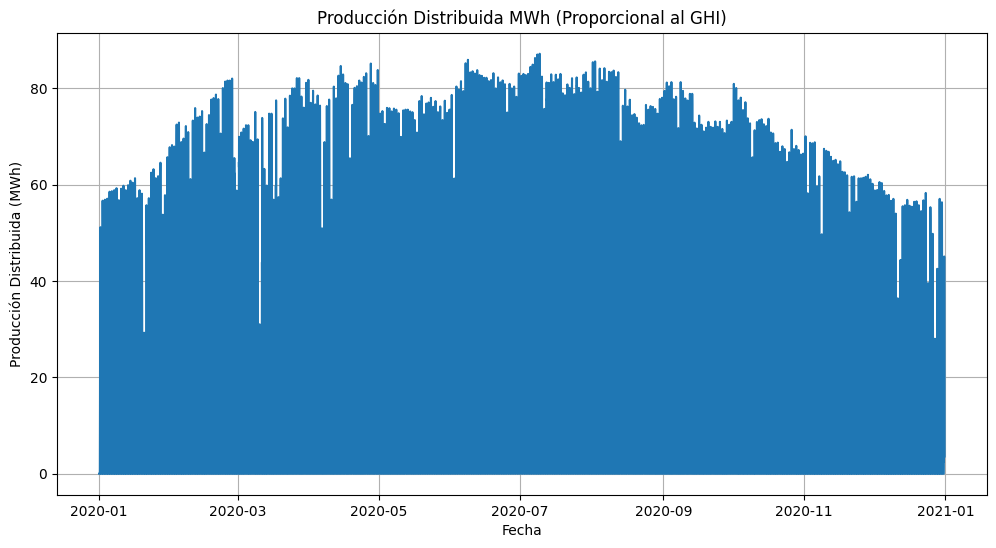

In [ ]:

# Graficar la producción distribuida para 2020
plt.figure(figsize=(12, 6))
plt.plot(df_2020.index, df_2020['produccion_distribuida_MWh'])
plt.title('Producción Distribuida MWh (Proporcional al GHI)')
plt.xlabel('Fecha')
plt.ylabel('Producción Distribuida (MWh)')
plt.grid(True)
plt.show()



In [20]:
df_2020.columns

Index(['ghi', 'dni', 'dhi', 'air_temperature', 'wind_speed',
       'solar_zenith_angle', 'relative_humidity', 'dew_point',
       'surface_albedo', 'total_precipitable_water', 'wind_direction',
       'surface_pressure', 'produccion_distribuida_MWh'],
      dtype='object')

## Variables del NSRDB (Meteorológicas y de Irradiancia)

- **ghi (Global Horizontal Irradiance):**  
    Irradiancia Horizontal Global (W/m²). Es la cantidad total de radiación solar (directa + difusa) que recibe una superficie horizontal en la Tierra. Es la variable más importante para la producción de energía solar en sistemas fotovoltaicos (paneles solares) que no tienen seguimiento solar. Esencialmente, es la "materia prima" energética.

- **dni (Direct Normal Irradiance):**  
    Irradiancia Normal Directa (W/m²). Es la cantidad de radiación solar que llega directamente desde el disco solar, medida en una superficie perpendicular a los rayos solares. Es fundamental para sistemas de concentración solar (CSP) y para paneles solares con seguimiento de dos ejes. También es importante para paneles fijos, ya que la mayor parte de la GHI en días despejados proviene de la DNI.

- **dhi (Diffuse Horizontal Irradiance):**  
    Irradiancia Horizontal Difusa (W/m²). Es la radiación solar que ha sido dispersada por la atmósfera (nubes, aerosoles, moléculas de aire). Llega a la superficie desde todas las direcciones, no solo desde la dirección del sol. Es importante en días nublados y contribuye a la producción incluso en paneles fijos.

- **air_temperature:**  
    Temperatura del aire (ºC). La temperatura ambiente afecta la eficiencia de los paneles solares. Los paneles fotovoltaicos son menos eficientes a temperaturas más altas (típicamente, pierden alrededor de un 0.4-0.5% de eficiencia por cada grado Celsius por encima de 25°C, aunque esto varía según la tecnología).

- **wind_speed:**  
    Velocidad del viento (m/s). El viento ayuda a enfriar los paneles solares, mejorando su eficiencia y contrarrestando el efecto negativo de la alta temperatura. Sin embargo, un viento excesivo puede causar problemas mecánicos.

- **solar_zenith_angle:**  
    Ángulo cenital solar (grados). Es el ángulo entre el sol y la vertical (el cenit).  
    - Un ángulo de 0° indica que el sol está directamente encima.  
    - Un ángulo de 90° indica que el sol está en el horizonte.  
    Este ángulo es fundamental porque:
    - Determina la cantidad de atmósfera que la radiación solar debe atravesar (a mayor ángulo cenital, mayor atenuación).  
    - Influye en el ángulo de incidencia de la radiación sobre una superficie, algo especialmente importante para superficies inclinadas, como los paneles solares.

- **relative_humidity:**  
    Humedad relativa (%). Representa la cantidad de vapor de agua presente en el aire en relación con la cantidad máxima posible a esa temperatura. Una alta humedad puede reducir ligeramente la irradiancia (debido a la absorción y dispersión del vapor), aunque su efecto es menor que el de las nubes.

- **dew_point:**  
    Temperatura del punto de rocío (ºC). Es la temperatura a la cual el aire se satura de vapor de agua y comienza la condensación. Está relacionada con la humedad relativa y puede ser relevante para predecir la formación de rocío o escarcha en los paneles, lo que reduciría la producción de energía.

- **surface_albedo:**  
    Albedo de la superficie (adimensional, entre 0 y 1). Es la fracción de la radiación solar reflejada por la superficie terrestre.  
    - Un albedo de 0 indica que la superficie absorbe toda la radiación.  
    - Un albedo de 1 indica que la superficie refleja toda la radiación.  
    Este parámetro afecta principalmente la radiación que incide en paneles bifaciales (capaces de captar radiación por ambas caras) y, en menor medida, la radiación difusa.

- **total_precipitable_water:**  
    Agua precipitable total (cm). Es la cantidad total de vapor de agua en una columna vertical de la atmósfera. A mayor contenido de vapor, se incrementa la absorción y dispersión de la radiación solar, lo que resulta en una menor irradiancia sobre la superficie.

- **wind_direction:**  
    Dirección del viento (grados, respecto al norte geográfico).  
    - 0° = Norte  
    - 90° = Este  
    - 180° = Sur  
    - 270° = Oeste  
    Es relevante para:
    - Modelos de soiling (acumulación de polvo), ya que pueden existir fuentes de polvo predominantes en una dirección determinada.
    - Estudiar el enfriamiento de los paneles en función de patrones de viento predominantes.

- **surface_pressure:**  
    Presión atmosférica en la superficie (hPa o Pa). Afecta la densidad del aire y, por ende, la cantidad de radiación que llega a la superficie. Su efecto suele ser menor en comparación con variables como el ángulo cenital, la nubosidad o la temperatura.

### Variable de Producción Estimada

- **produccion_distribuida_MWh:**  
    Esta variable se ha creado mediante la desagregación temporal y representa la estimación de la producción de energía solar de la planta Copper Mountain Solar, con la misma resolución temporal que los datos del NSRDB (horaria o de 30 minutos). Es la variable objetivo que se utilizará para entrenar el modelo de machine learning.

## ANALISIS EXPLORATORIO DE LOS DATOS ##

In [ ]:
df_2020.info()  #analizamos el conteo total de datos y el tipo de dato

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 17552 entries, 2020-01-01 00:00:00-08:00 to 2020-12-31 15:30:00-08:00
Data columns (total 13 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ghi                         17552 non-null  uint16 
 1   dni                         17552 non-null  uint16 
 2   dhi                         17552 non-null  uint16 
 3   air_temperature             17552 non-null  int16  
 4   wind_speed                  17552 non-null  uint16 
 5   solar_zenith_angle          17552 non-null  uint16 
 6   relative_humidity           17552 non-null  uint16 
 7   dew_point                   17552 non-null  int16  
 8   surface_albedo              17552 non-null  uint8  
 9   total_precipitable_water    17552 non-null  uint8  
 10  wind_direction              17552 non-null  uint16 
 11  surface_pressure            17552 non-null  uint16 
 12  produccion_distribuida_MWh  17552 non-nul

In [ ]:
df_2020.describe().T  #Visaulizamos el resumen estadistico de cada variable

,count,mean,std,min,25%,50%,75%,max
ghi,17552.0,243.051219,321.934634,0.0,0.00,8.000000,489.250000,1084.000000
dni,17552.0,332.570134,388.210179,0.0,0.00,21.000000,770.000000,1040.000000
dhi,17552.0,50.781449,69.442591,0.0,0.00,8.000000,88.000000,488.000000
air_temperature,17552.0,211.067058,112.960594,-20.0,115.00,204.000000,299.000000,464.000000
wind_speed,17552.0,25.162944,17.491286,2.0,13.00,19.000000,33.000000,120.000000
solar_zenith_angle,17552.0,8969.528088,3803.143485,1301.0,5920.75,8941.000000,12037.250000,16713.000000
relative_humidity,17552.0,2584.872436,1772.557539,248.0,1231.00,2018.500000,3568.500000,10000.000000
dew_point,17552.0,-25.958352,62.238799,-269.0,-66.00,-22.000000,19.000000,166.000000
surface_albedo,17552.0,19.534184,0.887992,18.0,19.00,20.000000,20.000000,21.000000
total_precipitable_water,17552.0,11.635825,5.737413,2.0,7.00,11.000000,15.000000,42.000000


In [ ]:
df_2020.isnull().sum()  #Verificamos la presencia de nulos

ghi                           0
dni                           0
dhi                           0
air_temperature               0
wind_speed                    0
solar_zenith_angle            0
relative_humidity             0
dew_point                     0
surface_albedo                0
total_precipitable_water      0
wind_direction                0
surface_pressure              0
produccion_distribuida_MWh    0
dtype: int64

In [ ]:

from ydata_profiling import ProfileReport  #Usamos ydata para generar el reporte para su Anlais Exploratorio

profile = ProfileReport(df_2020, title="Reporte de Perfil de Datos de Cooper Mountain Solar (2020)", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Análisis de Correlaciones y Selección de Variables

El mapa de calor muestra las relaciones físicas esperadas entre la irradiancia solar, el ángulo cenital y la producción de energía. Esta visualización nos ayuda a identificar que:

- **GHI**, **DNI** y el **ángulo cenital** muestran una fuerte correlación con la producción de energía, lo cual es un indicador prometedor para la construcción de un modelo predictivo.
- La inclusión de estas variables podría mejorar significativamente la precisión en la predicción de la producción a partir de los datos del NSRDB.

**Consideraciones Importantes:**
- **Multicolinealidad:** Al tener variables altamente correlacionadas entre sí, es fundamental evaluar la presencia de multicolinealidad para evitar redundancias y asegurar la estabilidad del modelo.
- **Relaciones Físicas:** La conexión intuitiva entre la radiación solar y la producción de energía respalda la elección de estas variables, sugiriendo que el impacto físico de estas se traduce directamente en el desempeño del modelo.

En resumen, el análisis confirma la relevancia de GHI, DNI y el ángulo cenital en la generación de energía y plantea los cuidados necesarios (como la multicolinealidad) para su incorporación en un modelo predictivo exitoso.

## INGENIERIA DE CARACTERISTICAS ##


In [ ]:
from sklearn.linear_model import LinearRegression, Lasso, Ridge  
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import TimeSeriesSplit  

# Ingeniería de Características
df_2020['hour'] = df_2020.index.hour
df_2020['dayofyear'] = df_2020.index.dayofyear
df_2020['month'] = df_2020.index.month
df_2020['dayofweek'] = df_2020.index.dayofweek
df_2020['weekofyear'] = df_2020.index.isocalendar().week
df_2020['hour_sin'] = np.sin(2 * np.pi * df_2020['hour'] / 24)
df_2020['hour_cos'] = np.cos(2 * np.pi * df_2020['hour'] / 24)
df_2020['dayofyear_sin'] = np.sin(2 * np.pi * df_2020['dayofyear'] / 366)
df_2020['dayofyear_cos'] = np.cos(2 * np.pi * df_2020['dayofyear'] / 366)

# Variables Lagged utiles para capturar la relacion del valor actual con el valor pasado de  una variable
df_2020['GHI_lag1'] = df_2020['ghi'].shift(1)
df_2020['GHI_lag2'] = df_2020['ghi'].shift(2)
df_2020['GHI_lag48'] = df_2020['ghi'].shift(48)  
df_2020['air_temperature_lag1'] = df_2020['air_temperature'].shift(1)

# Variaables rolling utiles para capturar la tendencia o el patron de los datos  alo largo del tiempo
df_2020['GHI_rolling_mean_24h'] = df_2020['ghi'].rolling(window=24*2, min_periods=1).mean()
df_2020['GHI_rolling_std_24h'] = df_2020['ghi'].rolling(window=24*2, min_periods=1).std()

#Creamos un indice de la claridad del cielo
if 'clearsky_ghi' in df_2020.columns:
    df_2020['clearness_index'] = df_2020['ghi'] / df_2020['clearsky_ghi']
    df_2020['clearness_index'].replace([np.inf, -np.inf], np.nan, inplace=True)
#Creamos valiables convinadas con la temperatura del aire y el angulo zenital solar
df_2020['GHI_x_Temp'] = df_2020['ghi'] * df_2020['air_temperature']
df_2020['DNI_x_Zenith'] = df_2020['dni'] * df_2020['solar_zenith_angle']

df_2020.dropna(inplace=True)


Se realizó una **ingeniería de características** sobre el DataFrame **df_2020** (datos horarios del NSRDB y producción distribuida) para mejorar el modelado predictivo. En este proceso se llevaron a cabo las siguientes acciones:

- **Creación de variables temporales**:  
    Se extrajeron la *hora*, el *día del año*, el *mes*, entre otras, y se generaron sus representaciones cíclicas (utilizando funciones seno y coseno) para capturar la naturaleza periódica de la información.

- **Incorporación de variables lagged**:  
    Se añadieron variables que representan valores pasados (lagged) de *GHI* y de la *producción*, lo cual permite capturar la autocorrelación en la serie de tiempo.

- **Cálculo de variables rolling**:  
    Se crearon variables basadas en ventanas móviles, tales como la media y la desviación estándar móvil de *GHI*, para suavizar la serie y extraer tendencias subyacentes.

- **Otros cálculos adicionales**:  
    - Se incluyó el **índice de claridad** (cuando existía la variable *clearsky_ghi*).  
    - Se definieron **interacciones entre variables** para explorar efectos combinados.

La verificación con el método `.info()` confirmó la creación exitosa de las nuevas características, evidenciando:

- **31 columnas** en total (incluyendo tanto las originales como las nuevas).
- Un **DatetimeIndex** correcto, con frecuencia de 30 minutos y en la zona horaria *-08:00*.
- **17504 entradas no nulas** en todas las columnas, lo que demuestra que el uso de `dropna()` eliminó correctamente los NaN generados por las operaciones de variables lagged y rolling.
- Los **tipos de datos** son adecuados para el análisis y modelado.

En resumen, el DataFrame resultante se encuentra en óptimas condiciones para realizar el modelado predictivo.

In [ ]:
df_2020.to_csv('D:\BOOTCAMP\DataBootcamp\df_2020.csv', index=True)  #guardamos el datafreme creado como un csv 

## MODELADO  ##


In [ ]:


# Preparación de Datos y Modelado 

variables_predictoras = [
    'dni', 'dhi', 'air_temperature', 'wind_speed',
    'solar_zenith_angle', 'relative_humidity',
    'hour_sin', 'hour_cos', 'dayofyear_sin', 'dayofyear_cos',
    'GHI_lag1', 'GHI_lag2', 'GHI_lag48', 
    'GHI_rolling_mean_24h', 'GHI_rolling_std_24h', 'air_temperature_lag1'
]

X = df_2020[variables_predictoras]
y = df_2020['produccion_distribuida_MWh']


# División simple ya que solo tenemos un año de datos reales 
train_size = int(len(df_2020) * 0.8)
X_train = X[:train_size]
X_test = X[train_size:]
y_train = y[:train_size]
y_test = y[train_size:]




In [ ]:

# Regresión Lineal 
print("-" * 30)
print("Regresión Lineal (con regularización):")
model_lr = Ridge(alpha=1.0)  # Utilizamos la regularizacion para reducir la multicolinealidad detectada previamente
model_lr.fit(X_train, y_train)
y_pred_lr = model_lr.predict(X_test)
rmse_lr = np.sqrt(mean_squared_error(y_test, y_pred_lr))
mae_lr = mean_absolute_error(y_test, y_pred_lr)
r2_lr = r2_score(y_test, y_pred_lr)
print(f"  RMSE: {rmse_lr:.2f} MWh")
print(f"  MAE: {mae_lr:.2f} MWh")
print(f"  R²: {r2_lr:.2f}")



------------------------------
Regresión Lineal (con regularización):
  RMSE: 3.44 MWh
  MAE: 2.76 MWh
  R²: 0.97


In [ ]:

# Random Forest 
print("-" * 30)
print("Random Forest (ajustado):")
model_rf = RandomForestRegressor(random_state=42, n_estimators=50, max_depth=5, min_samples_leaf=5)  
model_rf.fit(X_train, y_train)
y_pred_rf = model_rf.predict(X_test)
rmse_rf = np.sqrt(mean_squared_error(y_test, y_pred_rf))
mae_rf = mean_absolute_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)
print(f"  RMSE: {rmse_rf:.2f} MWh")
print(f"  MAE: {mae_rf:.2f} MWh")
print(f"  R²: {r2_rf:.2f}")



------------------------------
Random Forest (ajustado):
  RMSE: 2.49 MWh
  MAE: 1.23 MWh
  R²: 0.99


In [ ]:

# XGBoost 
print("-" * 30)
print("XGBoost (ajustado):")
model_xgb = XGBRegressor(objective='reg:squarederror',
                         learning_rate=0.05,  
                         max_depth=4,       
                         n_estimators=50,   
                         reg_alpha=0.1,     # L1 regularization
                         reg_lambda=0.1,    # L2 regularization
                         random_state=42,
                         n_jobs=-1)
model_xgb.fit(X_train, y_train)
y_pred_xgb = model_xgb.predict(X_test)
rmse_xgb = np.sqrt(mean_squared_error(y_test, y_pred_xgb))
mae_xgb = mean_absolute_error(y_test, y_pred_xgb)
r2_xgb = r2_score(y_test, y_pred_xgb)
print(f"  RMSE: {rmse_xgb:.2f} MWh")
print(f"  MAE: {mae_xgb:.2f} MWh")
print(f"  R²: {r2_xgb:.2f}")


------------------------------
XGBoost (ajustado):
  RMSE: 2.13 MWh
  MAE: 1.86 MWh
  R²: 0.99


## ELECCION DEL MODELO GANDOR ##


In [ ]:
import pandas as pd
import plotly.express as px

# Creamos un DataFrame para la comparación de modelos 
models = pd.DataFrame({
    'Model': ['Regresión Lineal', 'Random Forest', 'XGBoost'],
    'RMSE': [rmse_lr, rmse_rf, rmse_xgb],
    'MAE': [mae_lr, mae_rf, mae_xgb],
    'R²': [r2_lr, r2_rf, r2_xgb]
})

# Gráfico de Barras (RMSE) 
fig_rmse = px.bar(data_frame=models,
                  x='RMSE',
                  y='Model',
                  color='RMSE',
                  template='plotly_dark',  
                  title='Comparación de Modelos (RMSE)',
                  color_continuous_scale=px.colors.sequential.Reds_r,  
                  text='RMSE')  

fig_rmse.update_traces(texttemplate='%{text:.3f}', textposition='outside')  
fig_rmse.update_layout(xaxis_title="RMSE (MWh)",
                      yaxis_title="Modelo",
                      uniformtext_minsize=8, uniformtext_mode='hide') 
fig_rmse.show()


# Gráfico de Barras (MAE) 
fig_mae = px.bar(data_frame=models,
                 x='MAE',
                 y='Model',
                 color='MAE',
                 template='plotly_dark',
                 title='Comparación de Modelos (MAE)',
                 color_continuous_scale=px.colors.sequential.Reds_r,
                 text='MAE')

fig_mae.update_traces(texttemplate='%{text:.3f}', textposition='outside')
fig_mae.update_layout(xaxis_title="MAE (MWh)",
                     yaxis_title="Modelo",
                     uniformtext_minsize=8, uniformtext_mode='hide')
fig_mae.show()


# Gráfico de Barras (R²) 
fig_r2 = px.bar(data_frame=models,
                x='R²',
                y='Model',
                color='R²',
                template='plotly_dark',
                title='Comparación de Modelos (R²)',
                color_continuous_scale=px.colors.sequential.Blues,  
                text='R²')

fig_r2.update_traces(texttemplate='%{text:.3f}', textposition='outside')
fig_r2.update_layout(xaxis_title="R²",
                     yaxis_title="Modelo",
                     uniformtext_minsize=8, uniformtext_mode='hide')
fig_r2.show()

# Gráfico de dispersión 3D 
fig_3d = px.scatter_3d(data_frame=models,
                       x='RMSE',
                       y='MAE',
                       z='R²',
                       color='Model',
                       template='plotly_dark',
                       title='Comparación de Modelos (RMSE, MAE, R²)',
                       text='Model') 
fig_3d.update_traces(textposition='top center') 
fig_3d.show()

In [ ]:
print(models)  #Visualizamos las metricas de evaluacion de los modelos

              Model      RMSE       MAE        R²
0  Regresión Lineal  3.441250  2.757817  0.974802
1     Random Forest  2.489185  1.228561  0.986816
2           XGBoost  2.129217  1.857460  0.990353


In [ ]:
import joblib

# Guardar el modelo usando la libreria Joblib
joblib.dump(model_xgb, 'modelo_xgb_entrenado.pkl')

# Ejemplo de como cargar el modelo ya entrenado para su posterior uso
modelo_cargado = joblib.load('modelo_xgb_entrenado.pkl')



### CREACION DE UNA GRAFICA PARA COMPARAR LA PRODUCCION REAL Y LAS PREDICCIONES DEL MODELO GANADOR (XGBoost)

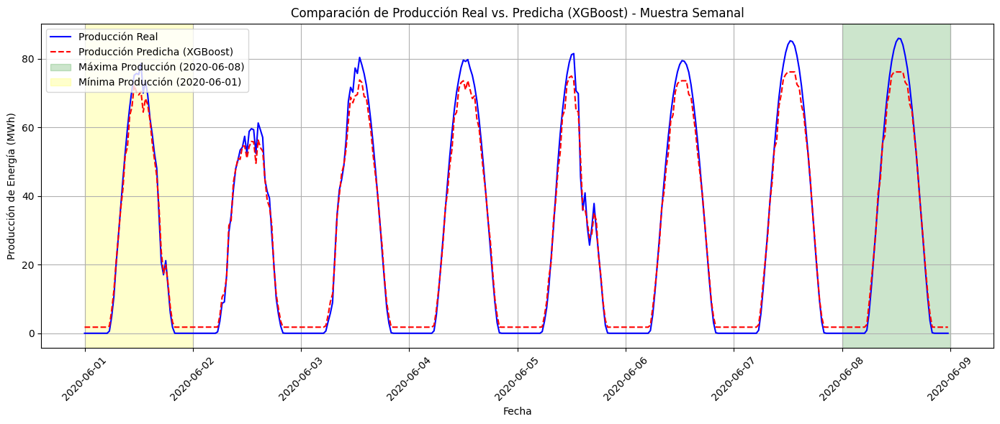


Métricas en el período de muestra (2020-06-01 a 2020-06-08):
RMSE: 3.0591
MAE: 2.4402
R²: 0.9897


C:\Users\Manuel\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import joblib


# Cargar el modelo XGBoost entrenado usando try-except para el manejo de errores
try:
    model_xgb = joblib.load('modelo_xgb_entrenado.pkl')
except FileNotFoundError:
    print("Error: No se encontró el archivo 'modelo_xgb_entrenado.pkl'.")
    print("Asegúrate de haber entrenado y guardado el modelo XGBoost.")
    exit()  

# Cargar el DataFrame con los datos 
try:
    df_2020 = pd.read_csv('D:\BOOTCAMP\DataBootcamp\df_2020.csv', index_col=0, parse_dates=True)
    df_2020.index = pd.to_datetime(df_2020.index, utc=True)

    # Usamos un if para asegurar establecer la zona horaria
    if df_2020.index.tz is None:
      df_2020 = df_2020.tz_localize('UTC').tz_convert('America/Los_Angeles')
    elif str(df_2020.index.tz) != 'America/Los_Angeles':
        df_2020 = df_2020.tz_convert('America/Los_Angeles')
except FileNotFoundError:
    print("Error: No se encontró el archivo 'df_2020.csv'.")
    print("Asegúrate de haber creado y guardado el DataFrame correctamente.")
    exit()


# Preparar los datos para la predicción 
features = model_xgb.feature_names_in_  # Obtiene los nombres de las características
X = df_2020[features]



# Realizar la predicción 
y_pred = model_xgb.predict(X)

# Crear un DataFrame para la visualización 
df_predicciones = pd.DataFrame({'Real': df_2020['produccion_distribuida_MWh'], 'Predicha': y_pred}, index=df_2020.index)

# Seleccionar el período de muestra una semana
start_date = '2020-06-01'
end_date = '2020-06-08'  

df_muestra = df_predicciones[start_date:end_date]
df_muestra.index = df_muestra.index.tz_localize(None)

# Crear el gráfico de serie temporal 

plt.figure(figsize=(14, 6))  

plt.plot(df_muestra.index, df_muestra['Real'], label='Producción Real', color='blue')
plt.plot(df_muestra.index, df_muestra['Predicha'], label='Producción Predicha (XGBoost)', color='red', linestyle='--')

# Resaltar momentos de mayor y menor producción 

# Encontrar el día de máxima producción real
max_prod_day = df_muestra['Real'].idxmax().date() 
plt.axvspan(pd.Timestamp(max_prod_day), pd.Timestamp(max_prod_day) + pd.Timedelta(days=1), color='green', alpha=0.2, label=f'Máxima Producción ({max_prod_day})')

# Encontrar el día de mínima producción real
min_prod_day = df_muestra['Real'].idxmin().date()
plt.axvspan(pd.Timestamp(min_prod_day), pd.Timestamp(min_prod_day) + pd.Timedelta(days=1), color='yellow', alpha=0.2, label=f'Mínima Producción ({min_prod_day})')

plt.xlabel('Fecha')
plt.ylabel('Producción de Energía (MWh)')
plt.title('Comparación de Producción Real vs. Predicha (XGBoost) - Muestra Semanal')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)  
plt.tight_layout()
plt.show()


# Cálculo de métricas en el período de muestra 
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

rmse = mean_squared_error(df_muestra['Real'], df_muestra['Predicha'], squared=False)
mae = mean_absolute_error(df_muestra['Real'], df_muestra['Predicha'])
r2 = r2_score(df_muestra['Real'], df_muestra['Predicha'])

print(f"\nMétricas en el período de muestra ({start_date} a {end_date}):")
print(f"RMSE: {rmse:.4f}")
print(f"MAE: {mae:.4f}")
print(f"R²: {r2:.4f}")

## CREAMOS UN GRAFICO PARA VISUALIZAR LA IMPORTANCIA DE LAS CARACTERISTICAS PARA EL MODELO (XGBoost)

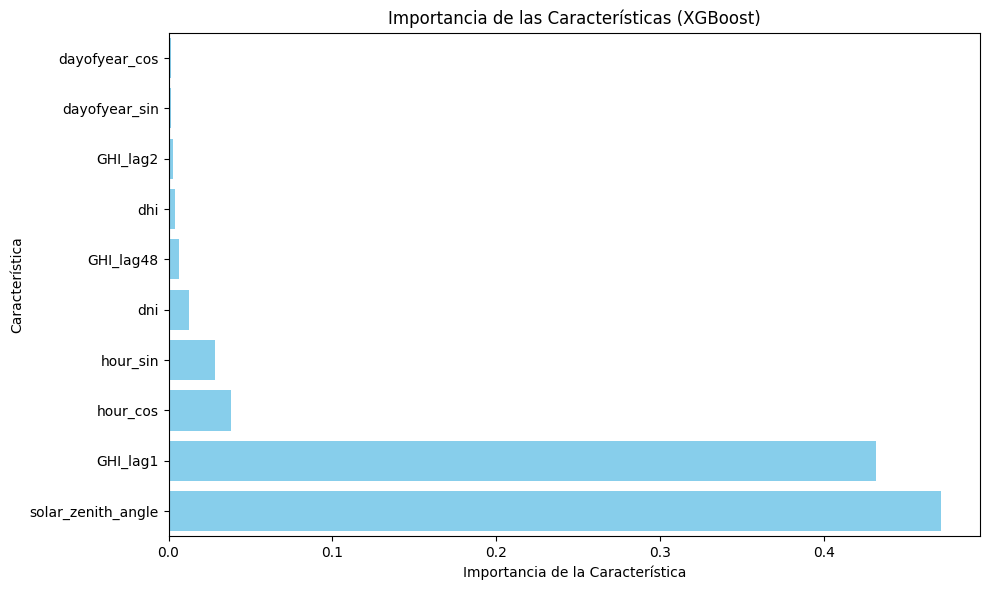


Tabla de Importancia de Características:
                 Feature  Importance
4     solar_zenith_angle    0.471774
10              GHI_lag1    0.431616
7               hour_cos    0.038284
6               hour_sin    0.028644
0                    dni    0.012536
12             GHI_lag48    0.006274
1                    dhi    0.003746
11              GHI_lag2    0.002812
8          dayofyear_sin    0.001591
9          dayofyear_cos    0.001349
13  GHI_rolling_mean_24h    0.000685
14   GHI_rolling_std_24h    0.000427
2        air_temperature    0.000141
15  air_temperature_lag1    0.000121
3             wind_speed    0.000000
5      relative_humidity    0.000000


In [ ]:
import matplotlib.pyplot as plt
import joblib
import pandas as pd
import numpy as np

# Cargar el modelo XGBoost entrenado
try:
    model_xgb = joblib.load('modelo_xgb_entrenado.pkl')
except FileNotFoundError:
    print("Error: No se encontró el archivo 'modelo_xgb_entrenado.pkl'.")
    print("Asegúrate de haber entrenado y guardado el modelo XGBoost.")
    exit()

# Obtener la importancia de las características 
try:
  feature_importances = model_xgb.feature_importances_
except AttributeError:
  print("Error: El objeto model_xgb no tiene el atributo 'feature_importances_'.")
  print("Asegurate de que el modelo cargado es un modelo XGBoost entrenado (ej. XGBRegressor o XGBClassifier).")
  exit()

# Obtener los nombres de las características
try:
  feature_names = model_xgb.feature_names_in_
except AttributeError:
    print("Error: El objeto model_xgb no tiene el atributo 'feature_names_in_'.")
    print("Asegúrate de que el modelo se entrenó usando un DataFrame de Pandas (con nombres de columnas).")
    print("Si entrenaste con un array NumPy, debes proporcionar los nombres manualmente.")
    exit()

# Crear un DataFrame para la visualización 
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})

# Ordenar el DataFrame por importancia (de mayor a menor) 
importance_df = importance_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Importancia de la Característica')
plt.ylabel('Característica')
plt.title('Importancia de las Características (XGBoost)')
plt.gca().invert_yaxis()

cutoff_feature = 'dayofyear_cos'
try:
    cutoff_index = importance_df[importance_df['Feature'] == cutoff_feature].index[0]
except IndexError:
    print(f"Error: La característica '{cutoff_feature}' no se encuentra en el DataFrame.")
    exit()
plt.yticks(np.arange(cutoff_index + 1))  
plt.ylim(-0.5, cutoff_index + 0.5)  

plt.tight_layout()
plt.show()

print("\nTabla de Importancia de Características:")
print(importance_df)

## CREAMOS UNA GRAFICA SIMULADA PARA EJEMPLIFICAR EL IMPACTO ECONOMICO DEL MODELO PREDICTIVO

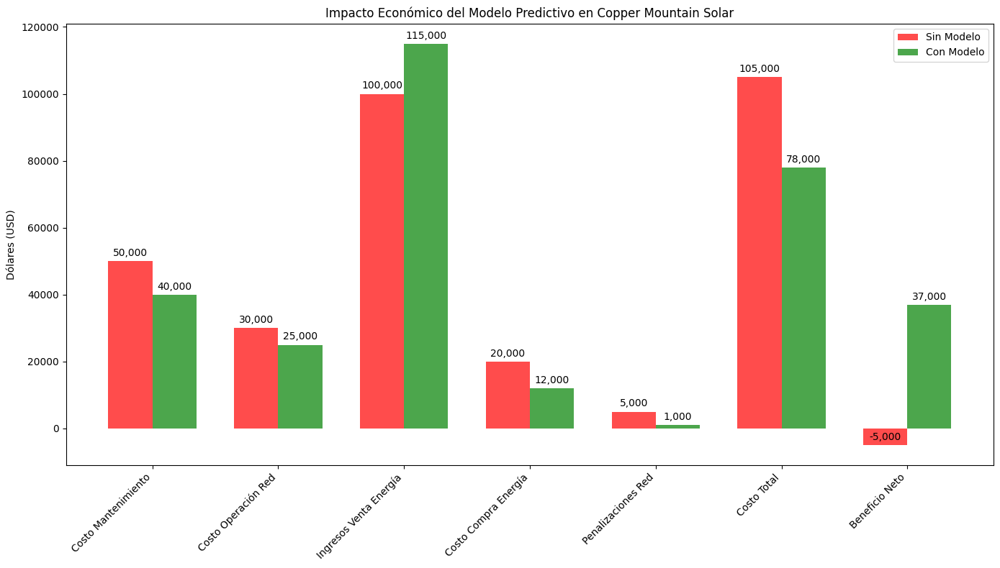

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Creamos un diccionario con Datos SIMULADOS
data = {
    'Escenario': ['Sin Modelo', 'Con Modelo'],
    'Costo Mantenimiento (USD)': [50000, 40000],  
    'Costo Operación Red (USD)': [30000, 25000],  
    'Ingresos Venta Energía (USD)': [100000, 115000],  
    'Costo Compra Energía (USD)': [20000, 12000],   
    'Penalizaciones Red (USD)': [5000, 1000]   
}

df_costos = pd.DataFrame(data)

# Calcular el Costo Total y el Beneficio Neto 

# Costo Total = Mantenimiento + Operación Red + Compra Energía + Penalizaciones
df_costos['Costo Total (USD)'] = (df_costos['Costo Mantenimiento (USD)'] +
                                  df_costos['Costo Operación Red (USD)'] +
                                  df_costos['Costo Compra Energía (USD)']+
                                   df_costos['Penalizaciones Red (USD)'])

# Beneficio Neto = Ingresos - Costo Total
df_costos['Beneficio Neto (USD)'] = df_costos['Ingresos Venta Energía (USD)'] - df_costos['Costo Total (USD)']

# Gráfico de Barras Agrupadas (Costos y Beneficios por Escenario) 
categories = ['Costo Mantenimiento', 'Costo Operación Red', 'Ingresos Venta Energía',
              'Costo Compra Energía','Penalizaciones Red', 'Costo Total', 'Beneficio Neto']
sin_modelo = df_costos[df_costos['Escenario'] == 'Sin Modelo'].iloc[0, 1:]  
con_modelo = df_costos[df_costos['Escenario'] == 'Con Modelo'].iloc[0, 1:]

x = np.arange(len(categories))  
width = 0.35  

fig, ax = plt.subplots(figsize=(14, 8))  
rects1 = ax.bar(x - width/2, sin_modelo, width, label='Sin Modelo', color='red', alpha=0.7)
rects2 = ax.bar(x + width/2, con_modelo, width, label='Con Modelo', color='green', alpha=0.7)

ax.set_ylabel('Dólares (USD)')
ax.set_title('Impacto Económico del Modelo Predictivo en Copper Mountain Solar')
ax.set_xticks(x)
ax.set_xticklabels(categories, rotation=45, ha="right")  
ax.legend()

def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height:,.0f}',  
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  
                    textcoords="offset points",
                    ha='center', va='bottom')
autolabel(rects1)
autolabel(rects2)
fig.tight_layout()
plt.show()




## CREAMOS UNA GRAFICA PARA VISUALIZAR EL IMPACTO EN EL BENEFICIO NETO CON Y SIN MODELO PREDICTIVO

C:\Users\Manuel\AppData\Local\Temp\ipykernel_20636\1702068859.py:59: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(['${:,.0f}K'.format(x/1000) for x in vals])


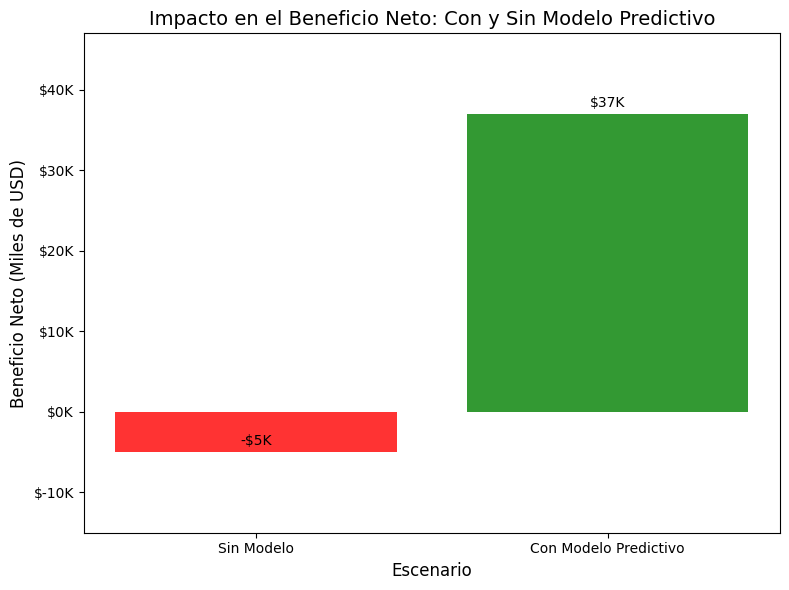

In [2]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Datos SIMULADOS 
data = {
    'Escenario': ['Sin Modelo', 'Con Modelo Predictivo'],
    'Costo Mantenimiento (USD)': [50000, 40000],
    'Costo Operación Red (USD)': [30000, 25000],
    'Ingresos Venta Energía (USD)': [100000, 115000],
    'Costo Compra Energía (USD)': [20000, 12000],
    'Penalizaciones Red (USD)': [5000, 1000]
}

df_costos = pd.DataFrame(data)

# Calcular el Costo Total y el Beneficio Neto 
df_costos['Costo Total (USD)'] = (df_costos['Costo Mantenimiento (USD)'] +
                                  df_costos['Costo Operación Red (USD)'] +
                                  df_costos['Costo Compra Energía (USD)'] +
                                  df_costos['Penalizaciones Red (USD)'])

df_costos['Beneficio Neto (USD)'] = df_costos['Ingresos Venta Energía (USD)'] - df_costos['Costo Total (USD)']


# Crear el Gráfico Simplificado

fig, ax = plt.subplots(figsize=(8, 6))  

# Datos para el gráfico
escenarios = df_costos['Escenario']
beneficio_neto = df_costos['Beneficio Neto (USD)']

rects = ax.bar(escenarios, beneficio_neto, color=['red', 'green'], alpha=0.8) #

ax.set_ylabel('Beneficio Neto (Miles de USD)', fontsize=12)
ax.set_xlabel('Escenario', fontsize=12)  
ax.set_title('Impacto en el Beneficio Neto: Con y Sin Modelo Predictivo', fontsize=14)

def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        if height < 0:
            label_position = height - 4000
            value_str = f'-${abs(height)/1000:,.0f}K' 
        else:
            label_position = height + 4000
            value_str = f'${height/1000:,.0f}K'
        ax.annotate(value_str,
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=10)

autolabel(rects)

ax.set_ylim(df_costos['Beneficio Neto (USD)'].min() - 10000, df_costos['Beneficio Neto (USD)'].max() + 10000)  # Ajustar límites
vals = ax.get_yticks()
ax.set_yticklabels(['${:,.0f}K'.format(x/1000) for x in vals])
plt.xticks(fontsize=10) 
plt.yticks(fontsize=10)

fig.tight_layout()  
plt.show()